<a href="https://colab.research.google.com/github/Boshra-01/FireSight_YOLO_Wildfire_Detection_Using_AI/blob/main/FireSight_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **FireSight: Smoke and Flame Detection Using Optimized YOLO Model**

In [ ]:
!pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"jannatulboshra","key":"1a0f97d5ba8e2f6c72cb3321e96bd4fb"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d sayedgamal99/smoke-fire-detection-yolo

Dataset URL: https://www.kaggle.com/datasets/sayedgamal99/smoke-fire-detection-yolo
License(s): CC0-1.0


In [ ]:
!unzip -q smoke-fire-detection-yolo.zip -d dataset

In [ ]:
!pip install -q torch torchvision torchaudio
!pip install -q opencv-python matplotlib pandas
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 111.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.5/983.5 kB 23.2 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import os
import random
from PIL import Image
import cv2
from ultralytics import YOLO
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
for dirname, _, filenames in os.walk('/content/dataset'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/dataset/data.yaml
/content/dataset/data/val/images/WEB07611.jpg
/content/dataset/data/val/images/WEB09011.jpg
/content/dataset/data/val/images/WEB09222.jpg
/content/dataset/data/val/images/PublicDataset00646.jpg
/content/dataset/data/val/images/WEB08096.jpg
/content/dataset/data/val/images/AoF06193.jpg
/content/dataset/data/val/images/WEB02629.jpg
/content/dataset/data/val/images/WEB04314.jpg
/content/dataset/data/val/images/WEB02165.jpg
/content/dataset/data/val/images/AoF05003.jpg
/content/dataset/data/val/images/PublicDataset00233.jpg
/content/dataset/data/val/images/PublicDataset00536.jpg
/content/dataset/data/val/images/WEB04809.jpg
/content/dataset/data/val/images/WEB02320.jpg
/content/dataset/data/val/images/AoF03499.jpg
/content/dataset/data/val/images/WEB02756.jpg
/content/dataset/data/val/images/AoF02842.jpg
/content/dataset/data/val/images/AoF01169.jpg
/content/dataset/data/val/images/AoF03645.jpg
/content/dataset/data/val/images/WEB07457.jpg
/content/dataset/data/v

In [ ]:
!ls /content/dataset

data  data.yaml


The image has dimensions 1086x610 and 3 channels.


100%|██████████| 6.25M/6.25M [00:00<00:00, 104MB/s]



0: 384x640 (no detections), 194.8ms
Speed: 35.8ms preprocess, 194.8ms inference, 181.2ms postprocess per image at shape (1, 3, 384, 640)


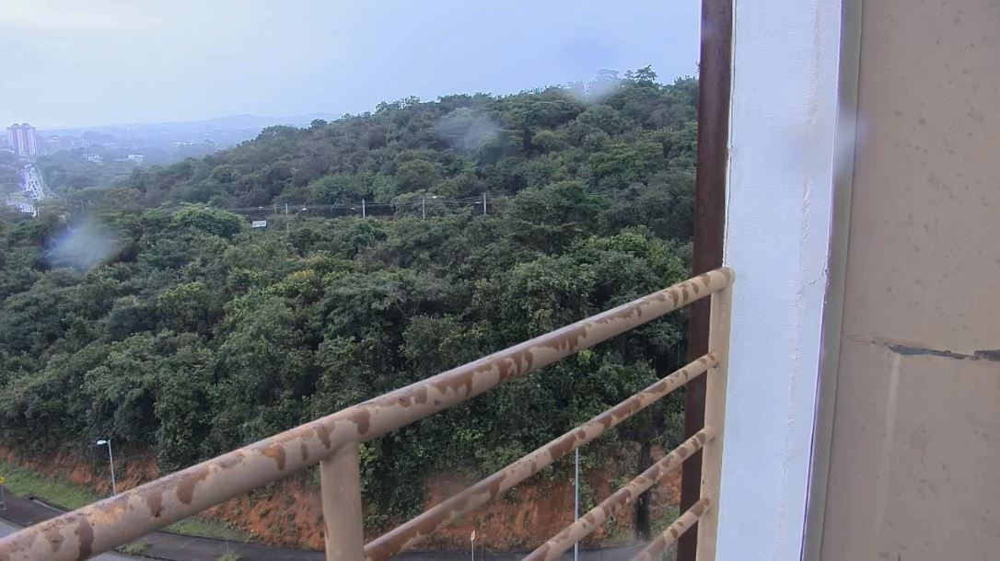

In [ ]:
image = cv2.imread("/content/dataset/data/train/images/AoF00000.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

model = YOLO("yolov8n.pt")
result_predict = model.predict(source=image, imgsz=(640))
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [ ]:
import torch
print(f"GPU available: {torch.cuda.is_available()}")
print(f"GPU name: {torch.cuda.get_device_name(0)}")

GPU available: True
GPU name: Tesla T4


In [ ]:
# Install ruamel.yaml and fix YAML configuration
!pip install ruamel.yaml
import ruamel.yaml

# First verify actual folder names
!ls /content/dataset/data  # Confirm if it shows 'val' or 'valid'

# Create corrected YAML (using 'val' instead of 'valid')
with open('corrected_data.yaml', 'w') as f:
    f.write("""path: /content/dataset
train: data/train/images
val: data/val/images  # Using 'val' to match actual folder
test: data/test/images

names: [smoke, fire]
nc: 2
""")

# Verify the new YAML
!cat corrected_data.yaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.7/117.7 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 739.1/739.1 kB 49.9 MB/s eta 0:00:00
test  train  val
path: /content/dataset
train: data/train/images
val: data/val/images  # Using 'val' to match actual folder
test: data/test/images

names: [smoke, fire]
nc: 2


In [ ]:
# Initialize and train model with corrected paths
final_model = YOLO('yolov8n.yaml').load('yolov8n.pt')

# Train with corrected YAML
Result_final_model = final_model.train(
    data="/content/corrected_data.yaml",  # here using absolute path
    epochs=5,
    imgsz=640,
    batch=16,
    lr0=0.01,
    dropout=0.15,

)

Transferred 355/355 items from pretrained weights
Ultralytics 8.3.115 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/corrected_data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=yolov8n.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, sh

100%|██████████| 755k/755k [00:00<00:00, 20.7MB/s]

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1     37248  ultralytics.nn.modules.block.C2f             [192, 64, 1]                  
 16                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 18                  -1  1    123648  ultralytics.nn.modules.block.C2f             [192, 128, 1]                 
 19                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384,

100%|██████████| 5.35M/5.35M [00:00<00:00, 72.6MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 49.3±28.1 MB/s, size: 133.6 KB)


train: Scanning /content/dataset/data/train/labels... 14122 images, 6458 backgrounds, 0 corrupt: 100%|██████████| 14122/14122 [00:23<00:00, 593.66it/s]

train: /content/dataset/data/train/images/WEB02521.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB06626.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07199.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07271.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07278.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07297.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07305.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07312.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07534.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07538.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/train/images/WEB07540.jpg: corrupt JPEG restored and saved
train: /content/dataset/data/tra

train: New cache created: /content/dataset/data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 17.6±7.6 MB/s, size: 79.9 KB)


val: Scanning /content/dataset/data/val/labels... 3099 images, 1375 backgrounds, 0 corrupt: 100%|██████████| 3099/3099 [00:04<00:00, 631.09it/s]

val: /content/dataset/data/val/images/WEB07535.jpg: corrupt JPEG restored and saved
val: /content/dataset/data/val/images/WEB07536.jpg: corrupt JPEG restored and saved
val: /content/dataset/data/val/images/WEB07539.jpg: corrupt JPEG restored and saved
val: /content/dataset/data/val/images/WEB07542.jpg: corrupt JPEG restored and saved
val: /content/dataset/data/val/images/WEB07561.jpg: corrupt JPEG restored and saved


val: New cache created: /content/dataset/data/val/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.04G      1.691      2.508      1.568         22        640: 100%|██████████| 883/883 [04:38<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:25<00:00,  3.76it/s]


                   all       3099       3932      0.449      0.452      0.409      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5       2.8G      1.702      1.909      1.567         20        640: 100%|██████████| 883/883 [04:22<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:23<00:00,  4.08it/s]


                   all       3099       3932      0.463      0.406       0.38       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.83G      1.649      1.775       1.53         30        640: 100%|██████████| 883/883 [04:20<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:23<00:00,  4.12it/s]

                   all       3099       3932      0.522      0.445      0.453      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.84G      1.581      1.636      1.477         37        640: 100%|██████████| 883/883 [04:21<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:24<00:00,  4.00it/s]


                   all       3099       3932       0.61      0.569      0.581      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.85G      1.498      1.472      1.419         22        640: 100%|██████████| 883/883 [04:25<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:23<00:00,  4.15it/s]


                   all       3099       3932      0.646      0.599      0.649      0.349

5 epochs completed in 0.403 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.115 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:24<00:00,  4.04it/s]


                   all       3099       3932      0.646      0.599      0.649      0.349
                 smoke       1550       1756      0.674       0.65      0.697      0.392
                  fire        879       2176      0.618      0.548      0.601      0.306
Speed: 0.2ms preprocess, 1.6ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train


In [ ]:
# Load Best Model and Evaluate
best_model_path = "/content/runs/detect/train/weights/best.pt"
Valid_model = YOLO(best_model_path)

# Evaluate on validation set
metrics = Valid_model.val(data="/content/corrected_data.yaml", split='val')

Ultralytics 8.3.115 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1197.3±454.0 MB/s, size: 59.0 KB)


val: Scanning /content/dataset/data/val/labels.cache... 3099 images, 1375 backgrounds, 0 corrupt: 100%|██████████| 3099/3099 [00:00<?, ?it/s]

val: /content/dataset/data/val/images/WEB07535.jpg: corrupt JPEG restored and saved
val: /content/dataset/data/val/images/WEB07536.jpg: corrupt JPEG restored and saved
val: /content/dataset/data/val/images/WEB07539.jpg: corrupt JPEG restored and saved
val: /content/dataset/data/val/images/WEB07542.jpg: corrupt JPEG restored and saved
val: /content/dataset/data/val/images/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 194/194 [00:38<00:00,  5.05it/s]


                   all       3099       3932      0.646      0.598      0.648      0.348
                 smoke       1550       1756      0.674       0.65      0.698      0.391
                  fire        879       2176      0.617      0.547      0.599      0.306
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/val



image 1/1 /content/dataset/data/test/images/WEB09853.jpg: 384x640 (no detections), 11.8ms
Speed: 1.9ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


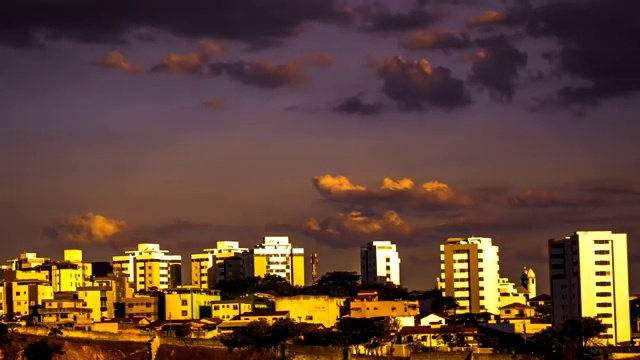


image 1/1 /content/dataset/data/test/images/AoF08375.jpg: 384x640 (no detections), 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


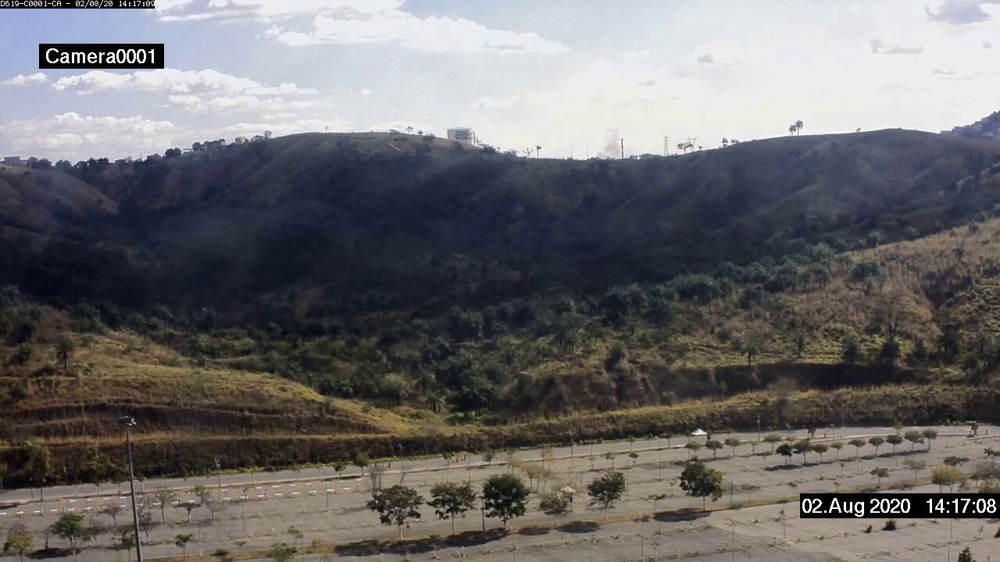


image 1/1 /content/dataset/data/test/images/WEB11078.jpg: 480x640 2 smokes, 61.5ms
Speed: 3.9ms preprocess, 61.5ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


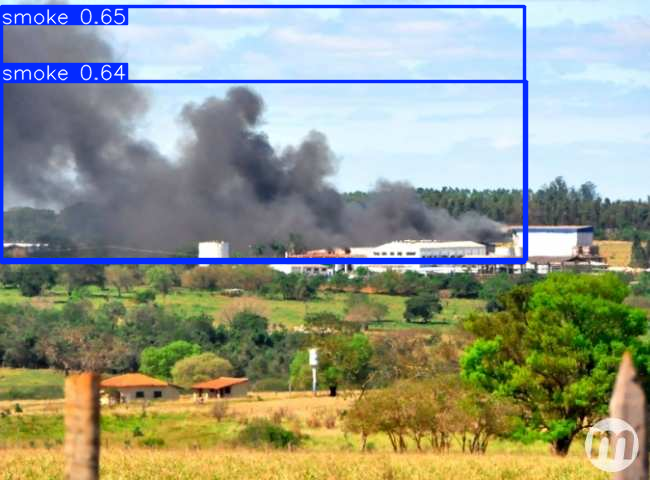


image 1/1 /content/dataset/data/test/images/WEB10905.jpg: 416x640 1 fire, 53.3ms
Speed: 1.9ms preprocess, 53.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


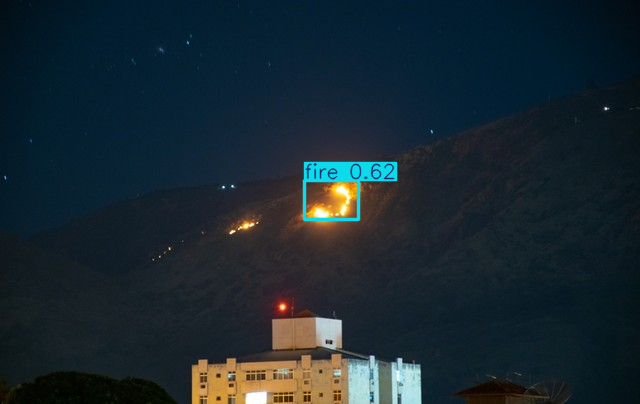


image 1/1 /content/dataset/data/test/images/AoF07104.jpg: 384x640 (no detections), 9.9ms
Speed: 3.4ms preprocess, 9.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


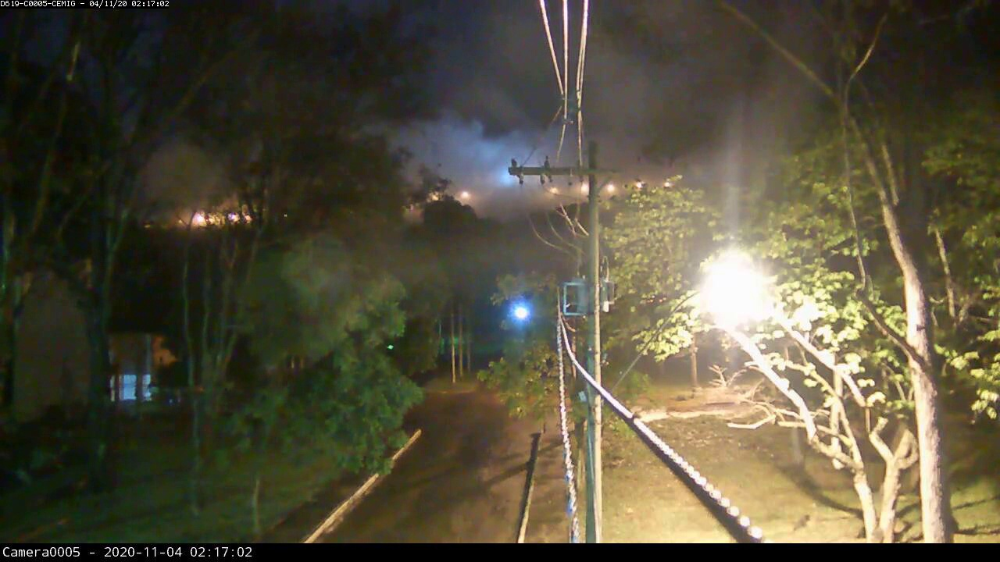


image 1/1 /content/dataset/data/test/images/AoF07380.jpg: 384x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


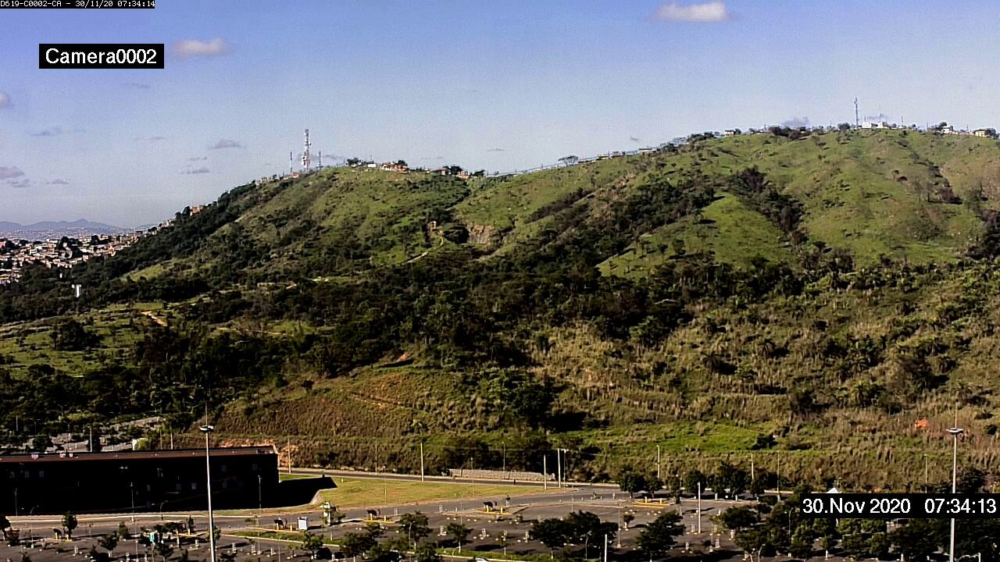


image 1/1 /content/dataset/data/test/images/WEB10252.jpg: 384x640 (no detections), 12.6ms
Speed: 4.3ms preprocess, 12.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


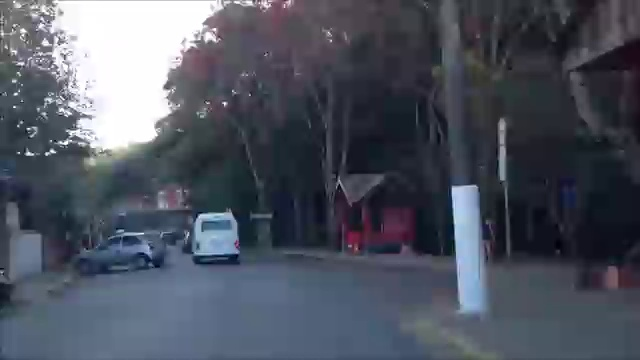


image 1/1 /content/dataset/data/test/images/AoF06753.jpg: 384x640 (no detections), 15.1ms
Speed: 2.8ms preprocess, 15.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


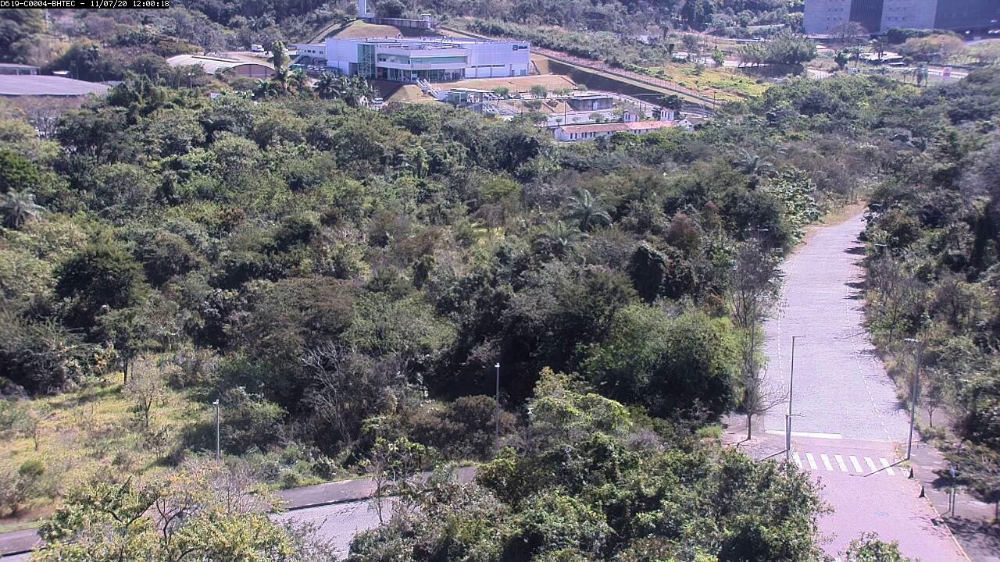


image 1/1 /content/dataset/data/test/images/AoF07419.jpg: 384x640 (no detections), 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


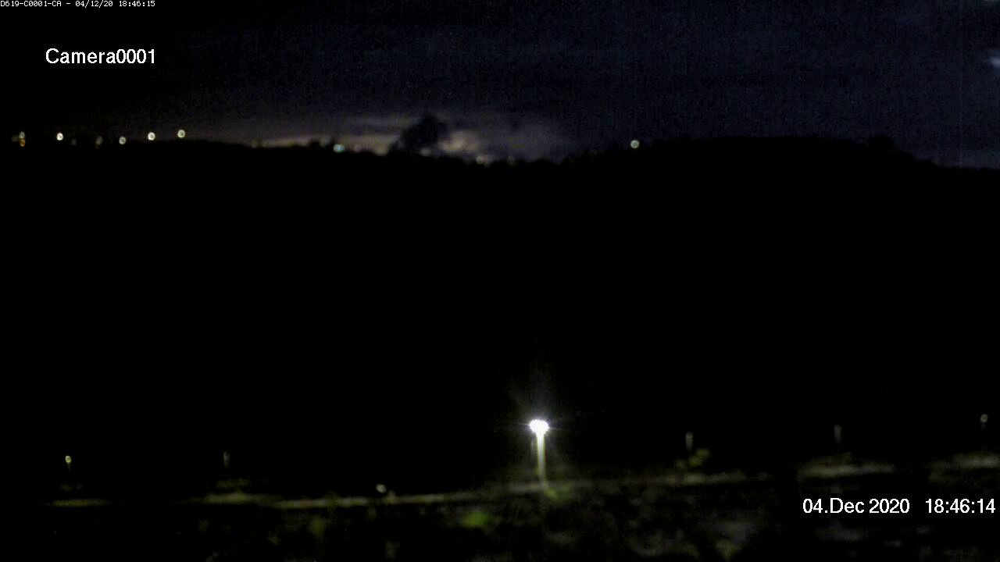


image 1/1 /content/dataset/data/test/images/WEB10365.jpg: 640x448 (no detections), 62.1ms
Speed: 3.4ms preprocess, 62.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 448)


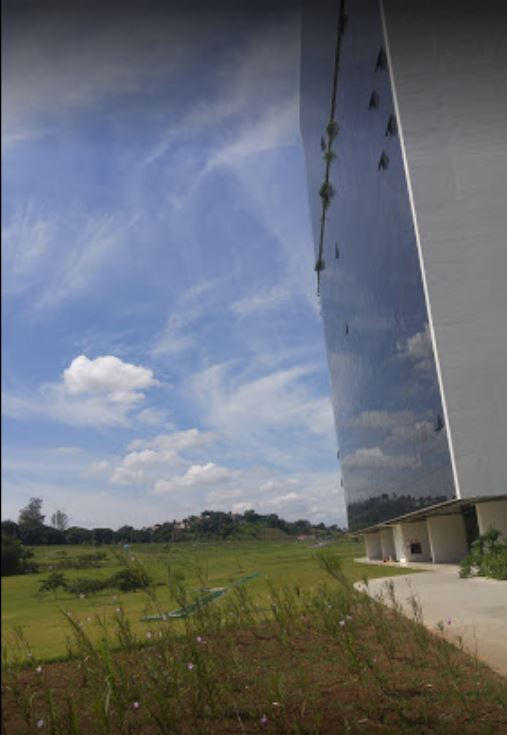

In [ ]:
#  Test Inference on 10 Images
test_images_dir = "/content/dataset/data/test/images"
test_images = os.listdir(test_images_dir)

for i in range(10):
    img_path = os.path.join(test_images_dir, test_images[i])
    results = Valid_model.predict(source=img_path, imgsz=640, conf=0.4)
    plot = results[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))


image 1/1 /content/dataset/data/test/images/WEB09853.jpg: 384x640 (no detections), 14.0ms
Speed: 5.4ms preprocess, 14.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF08375.jpg: 384x640 (no detections), 15.5ms
Speed: 2.2ms preprocess, 15.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/WEB11078.jpg: 480x640 2 smokes, 16.1ms
Speed: 3.2ms preprocess, 16.1ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/dataset/data/test/images/WEB10905.jpg: 416x640 2 fires, 12.9ms
Speed: 1.7ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/dataset/data/test/images/AoF07104.jpg: 384x640 (no detections), 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF07380.jpg: 384x640 (no detect

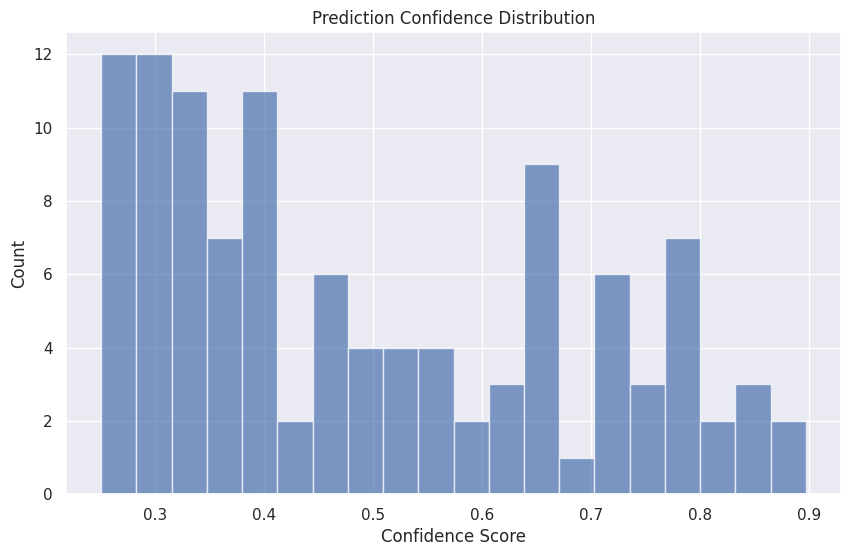

In [ ]:
#  Prediction Confidence Distribution
confidences = []
for img_file in os.listdir(test_images_dir)[:100]:  # First 100 test images
    results = Valid_model.predict(os.path.join(test_images_dir, img_file))
    confidences.extend([box.conf.item() for box in results[0].boxes])

plt.figure(figsize=(10, 6))
plt.hist(confidences, bins=20, alpha=0.7)
plt.title('Prediction Confidence Distribution')
plt.xlabel('Confidence Score')
plt.ylabel('Count')
plt.show()


image 1/1 /content/dataset/data/test/images/WEB09853.jpg: 384x640 (no detections), 10.1ms
Speed: 1.7ms preprocess, 10.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF08375.jpg: 384x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/WEB11078.jpg: 480x640 2 smokes, 8.4ms
Speed: 3.4ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/dataset/data/test/images/WEB10905.jpg: 416x640 2 fires, 10.8ms
Speed: 1.8ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/dataset/data/test/images/AoF07104.jpg: 384x640 (no detections), 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF07380.jpg: 384x640 (no detections

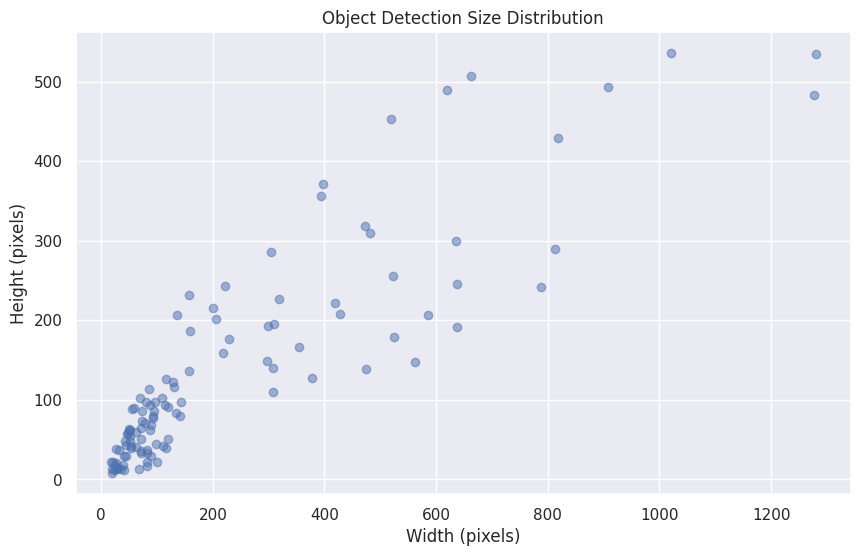

In [ ]:
# Detection Size Analysis
widths = []
heights = []
for img_file in os.listdir(test_images_dir)[:100]:
    results = Valid_model.predict(os.path.join(test_images_dir, img_file))
    for box in results[0].boxes:
        w = box.xywh[0][2].item()
        h = box.xywh[0][3].item()
        widths.append(w)
        heights.append(h)

plt.figure(figsize=(10, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.title('Object Detection Size Distribution')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.grid(True)
plt.show()

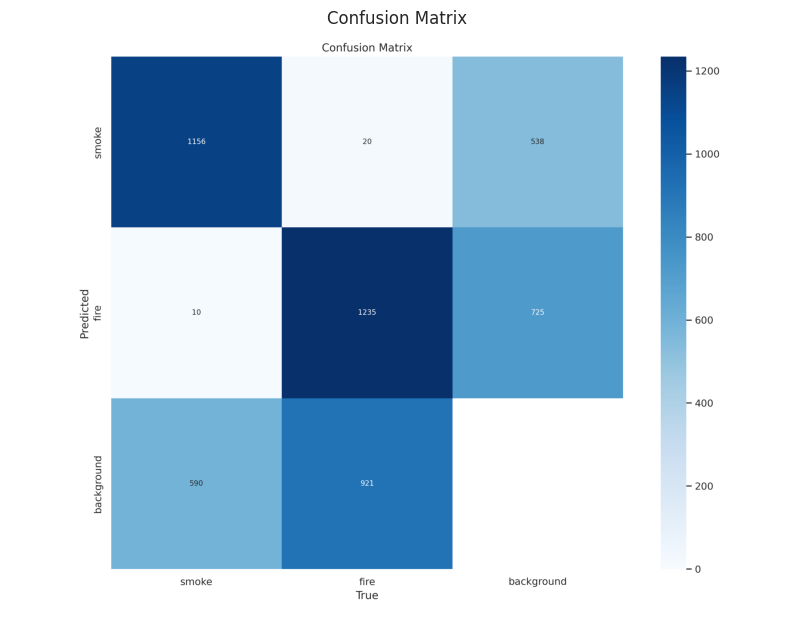

In [ ]:
#  Confusion Matrix Heatmap
cm_path = "/content/runs/detect/train/confusion_matrix.png"
if os.path.exists(cm_path):
    cm = cv2.imread(cm_path)
    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(cm, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Confusion Matrix')
    plt.show()

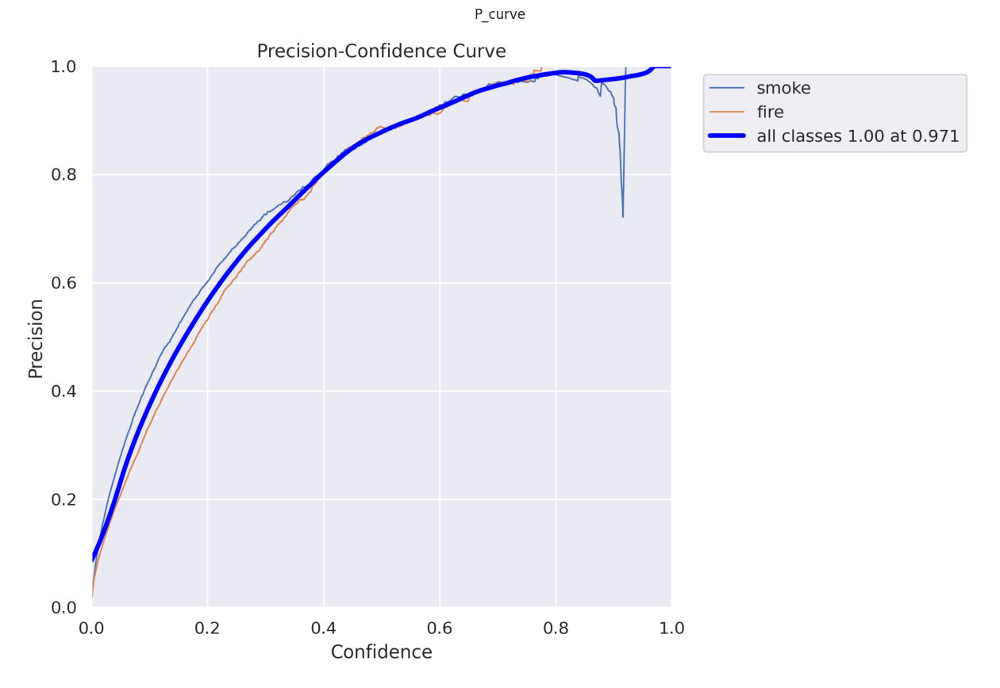

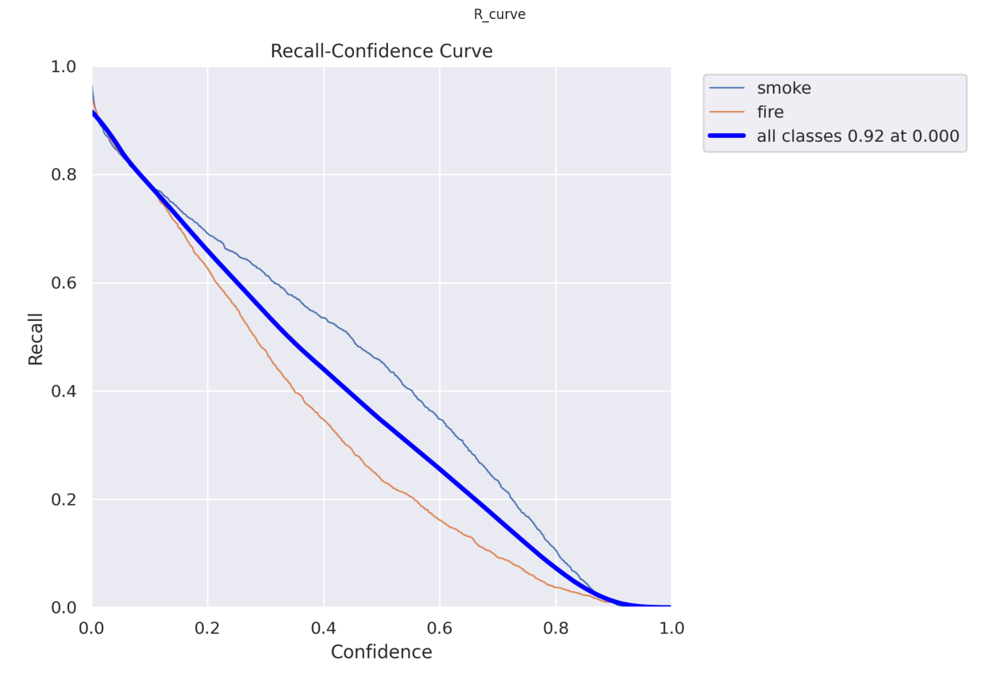

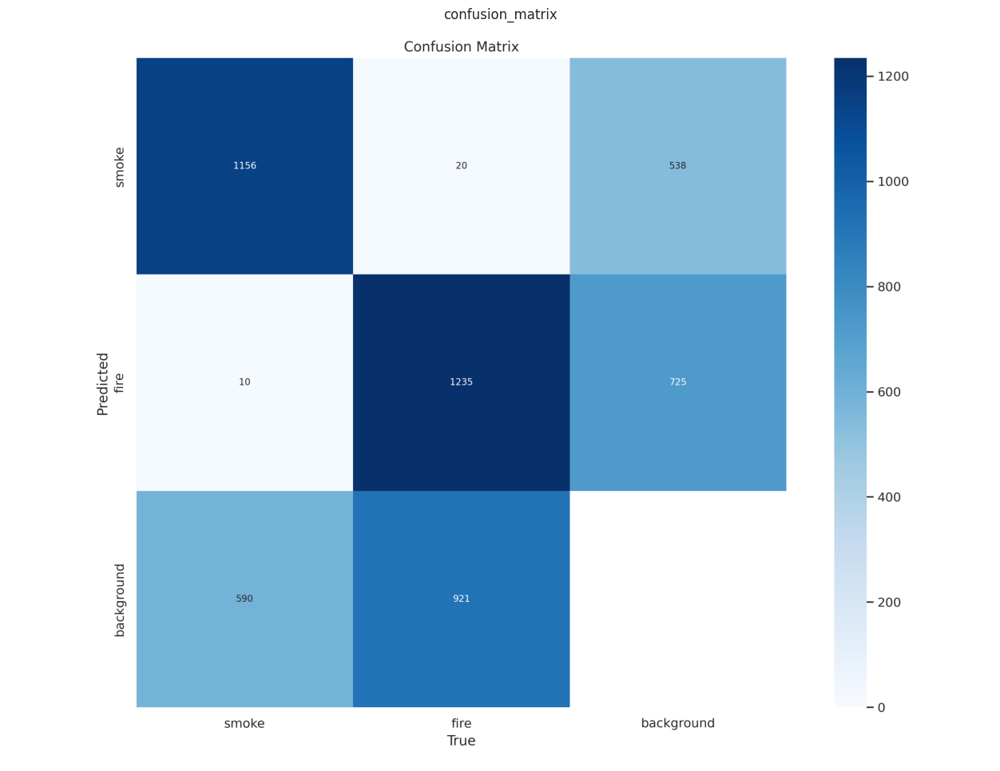

In [ ]:
# Visualize Training Metrics
list_of_metrics = ["P_curve.png", "R_curve.png", "confusion_matrix.png"]
for metric in list_of_metrics:
    img_path = f"/content/runs/detect/train/{metric}"
    if os.path.exists(img_path):
        img = cv2.imread(img_path)
        plt.figure(figsize=(16, 12))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(metric.split('.')[0])
        plt.show()
    else:
        print(f"Metric visualization {metric} not found at {img_path}")


image 1/1 /content/dataset/data/test/images/WEB09853.jpg: 384x640 (no detections), 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF08375.jpg: 384x640 (no detections), 6.3ms
Speed: 1.8ms preprocess, 6.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/WEB11078.jpg: 480x640 2 smokes, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/dataset/data/test/images/WEB10905.jpg: 416x640 2 fires, 7.8ms
Speed: 1.9ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/dataset/data/test/images/AoF07104.jpg: 384x640 (no detections), 7.3ms
Speed: 1.7ms preprocess, 7.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF07380.jpg: 384x640 (no detections), 6

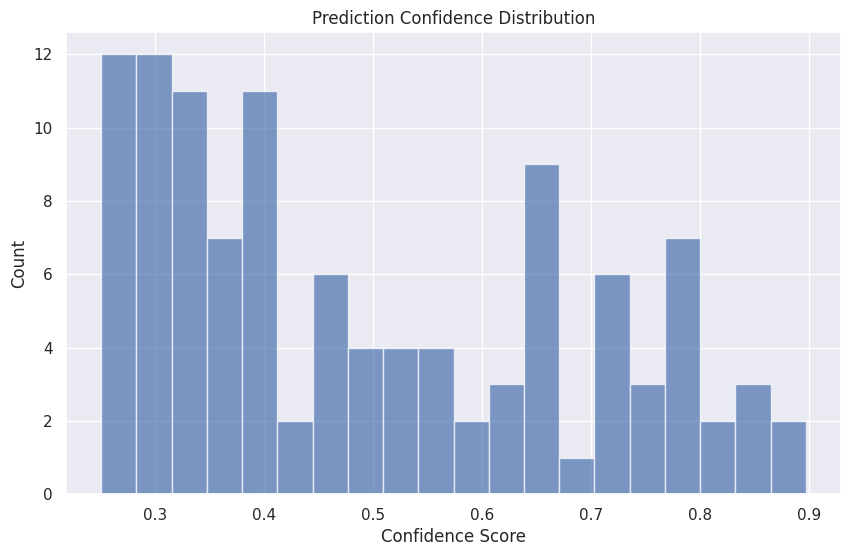

In [ ]:
#  Prediction Confidence Distribution
confidences = []
for img_file in os.listdir(test_images_dir)[:100]:  # First 100 test images
    results = Valid_model.predict(os.path.join(test_images_dir, img_file))
    confidences.extend([box.conf.item() for box in results[0].boxes])

plt.figure(figsize=(10, 6))
plt.hist(confidences, bins=20, alpha=0.7)
plt.title('Prediction Confidence Distribution')
plt.xlabel('Confidence Score')
plt.ylabel('Count')
plt.show()


image 1/1 /content/dataset/data/test/images/WEB09853.jpg: 384x640 (no detections), 7.1ms
Speed: 1.5ms preprocess, 7.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF08375.jpg: 384x640 (no detections), 6.2ms
Speed: 1.6ms preprocess, 6.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/WEB11078.jpg: 480x640 2 smokes, 8.1ms
Speed: 2.1ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/dataset/data/test/images/WEB10905.jpg: 416x640 2 fires, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/dataset/data/test/images/AoF07104.jpg: 384x640 (no detections), 8.5ms
Speed: 1.7ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF07380.jpg: 384x640 (no detections), 6

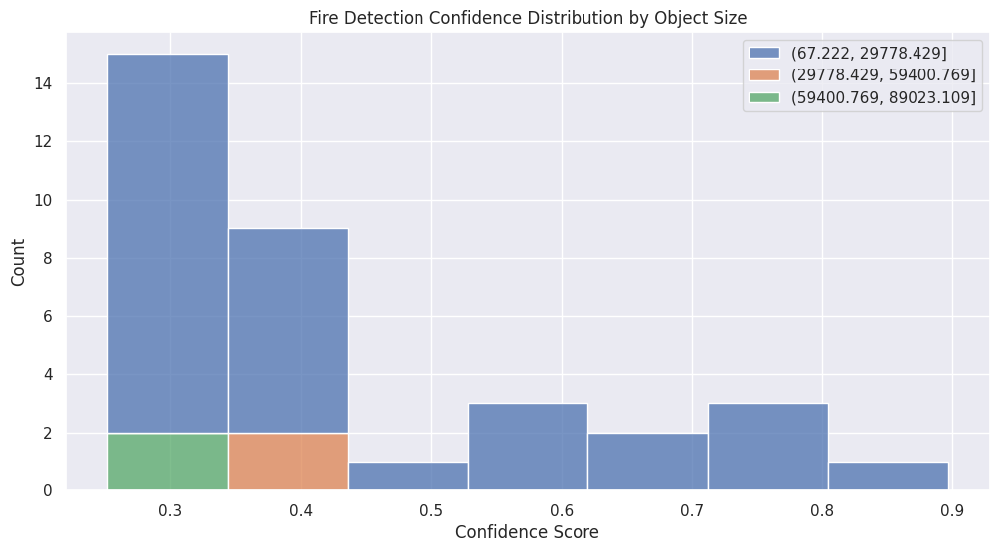

In [ ]:
# Threat Probability Distribution Analysis
confidences = []
sizes = []
test_images = os.listdir("/content/dataset/data/test/images")[:50]

for img_file in test_images:
    img_path = os.path.join("/content/dataset/data/test/images", img_file)
    results = Valid_model.predict(img_path)
    for box in results[0].boxes:
        if results[0].names[int(box.cls)] == 'fire':
            confidences.append(box.conf.item())
            sizes.append((box.xywh[0][2]*box.xywh[0][3]).item())  # Area

plt.figure(figsize=(12,6))
sns.histplot(x=confidences, hue=pd.cut(sizes, bins=3), multiple="stack")
plt.title('Fire Detection Confidence Distribution by Object Size')
plt.xlabel('Confidence Score')
plt.ylabel('Count')
plt.show()


image 1/1 /content/dataset/data/test/images/WEB11411.jpg: 448x640 1 fire, 7.8ms
Speed: 2.9ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/dataset/data/test/images/AoF07729.jpg: 384x640 3 smokes, 6 fires, 7.0ms
Speed: 1.6ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/WEB10279.jpg: 448x640 (no detections), 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 0.7ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/dataset/data/test/images/WEB11574.jpg: 384x640 1 smoke, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF07326.jpg: 384x640 (no detections), 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


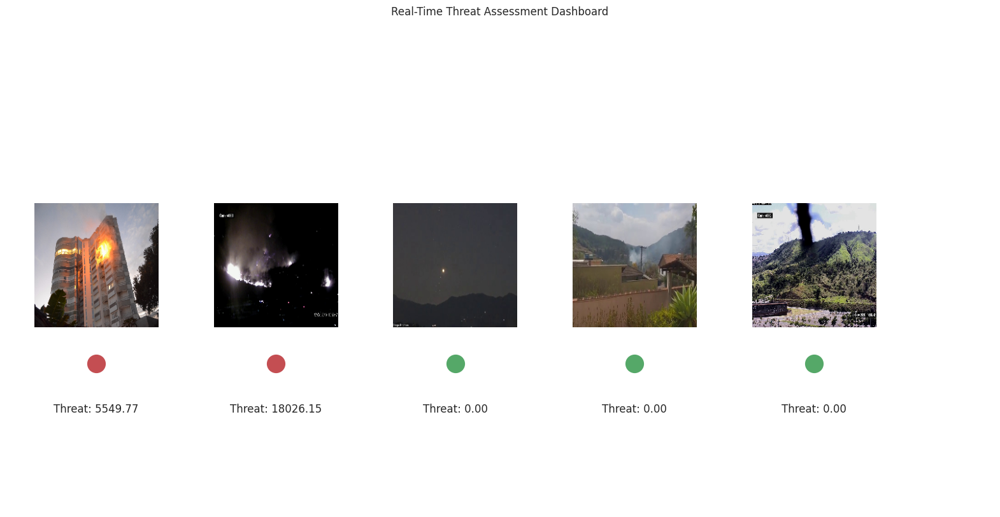

In [ ]:
#  Real-Time Threat Dashboard
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def create_threat_dashboard(image_paths):
    plt.figure(figsize=(20, 10))
    ax = plt.gca()

    for idx, img_path in enumerate(image_paths[:5]):
        # Get predictions
        results = Valid_model.predict(img_path)
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

        # Calculate threat score
        threat_score = sum(box.conf.item() * (box.xywh[0][2]*box.xywh[0][3])
                        for box in results[0].boxes if results[0].names[int(box.cls)] == 'fire')

        # Create thumbnail
        thumb = cv2.resize(img, (200, 200))
        imagebox = OffsetImage(thumb, zoom=0.7)
        ab = AnnotationBbox(imagebox, (idx*0.2, 0.5), frameon=False)
        ax.add_artist(ab)

        # Add threat indicator
        plt.plot(idx*0.2, 0.3, 'ro' if threat_score > 0.5 else 'go', markersize=20)
        plt.text(idx*0.2, 0.2, f"Threat: {threat_score:.2f}", ha='center')

    plt.xlim(-0.1, 1)
    plt.ylim(0, 1)
    plt.axis('off')
    plt.title('Real-Time Threat Assessment Dashboard')
    plt.show()

# Test with 5 random images
test_images = [os.path.join("/content/dataset/data/test/images", f)
              for f in random.sample(os.listdir("/content/dataset/data/test/images"), 5)]
create_threat_dashboard(test_images)

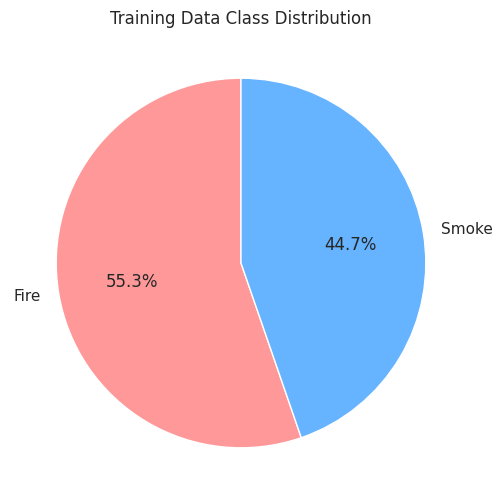

In [ ]:
# Smoke / Fire Class Distribution Pie Chart
class_counts = {
    'Fire': sum(1 for label_file in os.listdir("/content/dataset/data/train/labels")
               for line in open(f"/content/dataset/data/train/labels/{label_file}")
               if int(line.split()[0]) == 1),
    'Smoke': sum(1 for label_file in os.listdir("/content/dataset/data/train/labels")
                for line in open(f"/content/dataset/data/train/labels/{label_file}")
                if int(line.split()[0]) == 0)
}

plt.figure(figsize=(6,6))
plt.pie(class_counts.values(), labels=class_counts.keys(), autopct='%1.1f%%',
        colors=['#ff9999','#66b3ff'], startangle=90)
plt.title('Training Data Class Distribution')
plt.show()


image 1/1 /content/dataset/data/test/images/WEB09853.jpg: 384x640 (no detections), 18.2ms
Speed: 1.8ms preprocess, 18.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF08375.jpg: 384x640 (no detections), 12.9ms
Speed: 2.3ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/WEB11078.jpg: 480x640 2 smokes, 8.9ms
Speed: 4.8ms preprocess, 8.9ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/dataset/data/test/images/WEB10905.jpg: 416x640 2 fires, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/dataset/data/test/images/AoF07104.jpg: 384x640 (no detections), 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/test/images/AoF07380.jpg: 384x640 (no detect

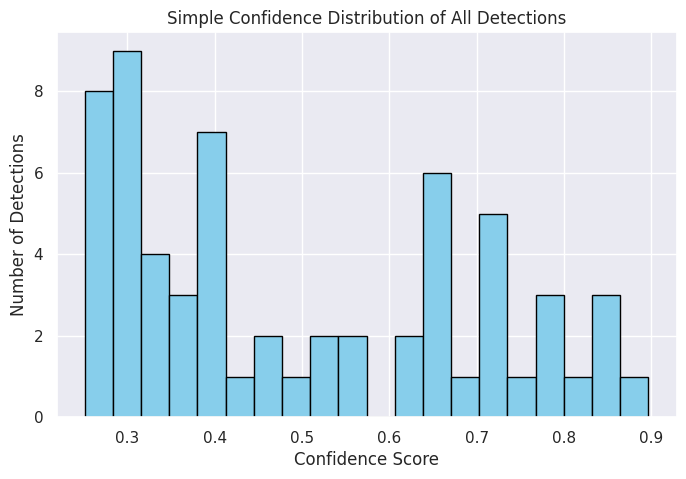

In [ ]:
# Smoke / Fire Confidence Distribution Histogram
confidences = []
for img_file in os.listdir("/content/dataset/data/test/images")[:50]:
    results = Valid_model.predict(os.path.join("/content/dataset/data/test/images", img_file))
    confidences.extend([box.conf.item() for box in results[0].boxes])

plt.figure(figsize=(8,5))
plt.hist(confidences, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Confidence Score')
plt.ylabel('Number of Detections')
plt.title('Simple Confidence Distribution of All Detections')
plt.show()

 Classification of Logistic Regression and KNN:

In [ ]:
# Setup
import cv2
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from glob import glob
from ultralytics import YOLO

model = YOLO('yolov8n.pt')

def get_features(img_path):
    img = cv2.resize(cv2.imread(img_path), (64,64))
    return [np.mean(img[:,:,0]), np.mean(img[:,:,1]), np.mean(img[:,:,2])]

#  Data Prep
image_paths = glob('/content/dataset/data/train/images/*.jpg')[:300]
X, y = [], []
for path in image_paths:
    try:
        X.append(get_features(path))
        y.append(1 if len(model.predict(path)[0].boxes) > 0 else 0)
    except:
        continue

X = StandardScaler().fit_transform(np.array(X))
y = np.array(y)

#  Classification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(f"Logistic: {LogisticRegression().fit(X_train,y_train).score(X_test,y_test):.2f}")
print(f"KNN: {KNeighborsClassifier(n_neighbors=3).fit(X_train,y_train).score(X_test,y_test):.2f}")


image 1/1 /content/dataset/data/train/images/WEB06517.jpg: 384x640 (no detections), 9.3ms
Speed: 3.1ms preprocess, 9.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/train/images/WEB04832.jpg: 384x640 (no detections), 8.4ms
Speed: 1.6ms preprocess, 8.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/train/images/AoF02749.jpg: 384x640 (no detections), 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/train/images/PublicDataset00447.jpg: 384x640 (no detections), 8.6ms
Speed: 1.6ms preprocess, 8.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/train/images/AoF02907.jpg: 384x640 (no detections), 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/dataset/data/train/images/WEB01155.

In [ ]:
#  Feature Extraction
import cv2
import numpy as np
from ultralytics import YOLO
from glob import glob
from tqdm import tqdm

model = YOLO('yolov8n.pt')

def enhanced_features(img_path):
    img = cv2.imread(img_path)
    if img is None:
        return None
    img = cv2.resize(img, (128,128))

    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    features = [
        np.mean(hsv[:,:,0]),
        np.std(hsv[:,:,1]),
        np.mean(hsv[:,:,2])
    ]


    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    features.extend([
        np.mean(cv2.Laplacian(gray, cv2.CV_64F)),
        np.std(gray)
    ])
    return features

#  Balanced Dataset Creation
image_paths = glob('/content/dataset/data/train/images/*.jpg')
X, y = [], []

for path in tqdm(image_paths[:1000]):
    try:
        feats = enhanced_features(path)
        if feats is not None:
            X.append(feats)
            y.append(1 if len(model.predict(path, verbose=False)[0].boxes) > 0 else 0)
    except:
        continue


from sklearn.utils import resample
X = np.array(X)
y = np.array(y)

# Classification
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

X_scaled = StandardScaler().fit_transform(X)

# Split with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, stratify=y, random_state=42
)



100%|██████████| 1000/1000 [00:20<00:00, 48.93it/s]


In [ ]:
# Method 1: Neural Network
nn = make_pipeline(
    StandardScaler(),
    MLPClassifier(hidden_layer_sizes=(32,), max_iter=500)
)
nn.fit(X_train, y_train)
print(f"Neural Network: {nn.score(X_test, y_test):.2f}")

Neural Network: 0.66


In [ ]:
# Method 2: Random Forest
rf = RandomForestClassifier(n_estimators=100, max_depth=5)
rf.fit(X_train, y_train)
print(f"Random Forest: {rf.score(X_test, y_test):.2f}")

Random Forest: 0.70


Cluster Analysis

Cluster Quality (Adjusted Rand Index): -0.06


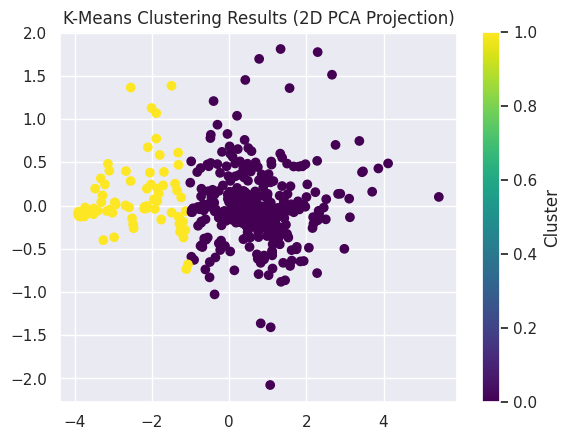

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Reloading features (X) and labels (y)
X = np.array([get_features(path) for path in image_paths[:500] if get_features(path) is not None])
y = np.array([1 if len(model.predict(path, verbose=False)[0].boxes) > 0 else 0
             for path in image_paths[:500] if get_features(path) is not None])

# Normalizing features
X_scaled = StandardScaler().fit_transform(X)

# clustering
kmeans = KMeans(n_clusters=2, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

# Evaluating clustering
ari = adjusted_rand_score(y, cluster_labels)
print(f"Cluster Quality (Adjusted Rand Index): {ari:.2f}")

# Visualizing clusters
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.scatter(X_pca[:,0], X_pca[:,1], c=cluster_labels, cmap='viridis')
plt.title("K-Means Clustering Results (2D PCA Projection)")
plt.colorbar(label="Cluster")
plt.show()

ROC Curve

<Figure size 800x600 with 0 Axes>

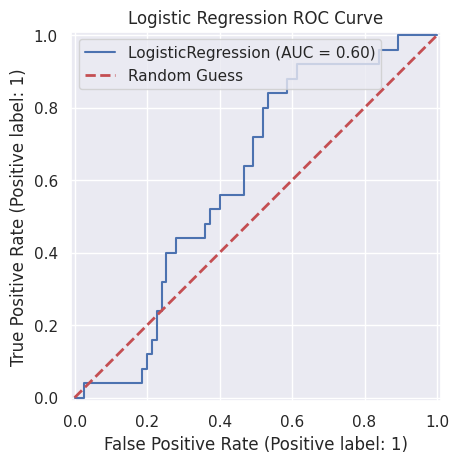

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import RocCurveDisplay

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)

# Generating ROC curve
plt.figure(figsize=(8,6))
RocCurveDisplay.from_estimator(lr, X_test, y_test)
plt.title('Logistic Regression ROC Curve')
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random Guess')
plt.legend()
plt.show()

Confusion Matrix with Metrics

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# Predictions
y_pred_lr = lr.predict(X_test)
y_pred_knn = KNeighborsClassifier(n_neighbors=3).fit(X_train, y_train).predict(X_test)

print("Logistic Regression:- ")
print(confusion_matrix(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_lr))

print("\nKNN:- ")
print(confusion_matrix(y_test, y_pred_knn))
print(classification_report(y_test, y_pred_knn))

Logistic Regression:- 
[[73  2]
 [25  0]]
              precision    recall  f1-score   support

           0       0.74      0.97      0.84        75
           1       0.00      0.00      0.00        25

    accuracy                           0.73       100
   macro avg       0.37      0.49      0.42       100
weighted avg       0.56      0.73      0.63       100


KNN:- 
[[70  5]
 [16  9]]
              precision    recall  f1-score   support

           0       0.81      0.93      0.87        75
           1       0.64      0.36      0.46        25

    accuracy                           0.79       100
   macro avg       0.73      0.65      0.67       100
weighted avg       0.77      0.79      0.77       100

